# Tutorial on visualization of Neural Networks

This exercise aims at exploring different ways of visualizing Neural Networks:
- t-SNE of representations (CIFAR10)
- grad-CAM (ImageNet)
- activation maximization (ImageNet)

e-mail: alice.blondel@minesparis.psl
22 nov


First, some preliminaries that facilitate plotting and data access on Google drive ... just execute !

In [3]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap

plt.rcParams['figure.figsize'] = (20.0, 20.0)
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%matplotlib inline
%load_ext autoreload
%autoreload 2

import importlib.util
import sys


In [1]:
!pip install pytorch_lightning --quiet
!pip install transformers==4.46.1 --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 33.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 43.1 MB/s eta 0:00:00


In [4]:
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"

In [5]:
# set random seed
torch.manual_seed(0)
np.random.seed(0)

# Visualization of the encodings by t-SNE

First, we will visualize encodings of a network trained on the CIFAR data set. Here, we import and preprocess the data. We keep the original labels in `y_data` (to be used for visualization later on). For training, we need to transform them to one-hot-vectors.

In [6]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

# Load CIFAR-10 dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # normalize to [-1, 1]
])

train_data = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_data = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# Separate training data into train and validation sets
train_size = 40000
val_size = len(train_data) - train_size
train_data, val_data = random_split(train_data, [train_size, val_size])

# Convert labels to one-hot encoding
def one_hot_encode(labels, num_classes=10):
    return torch.eye(num_classes)[labels]

# Load data into DataLoaders
train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
val_loader = DataLoader(val_data, batch_size=64, shuffle=False)
test_loader = DataLoader(test_data, batch_size=64, shuffle=False)

100%|██████████| 170M/170M [00:16<00:00, 10.1MB/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


We will first visualize the data.

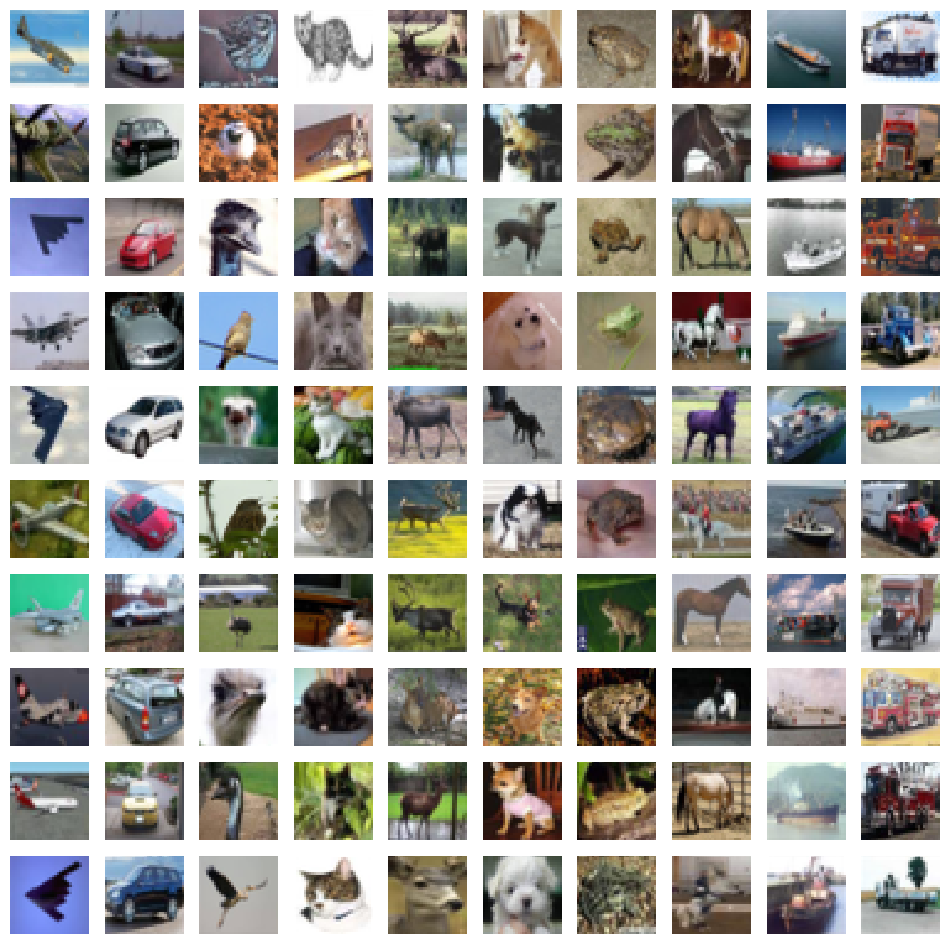

In [7]:
# helper function to plot a few images for each class
def plot_array(fig, dataset, classes_to_plot=None, samples_per_class=7):
    Y = dataset.targets
    if classes_to_plot is None:
        classes_to_plot = np.unique(Y)
    num_classes = len(classes_to_plot)

    for k, y in enumerate(classes_to_plot):
        idxs = np.flatnonzero(Y == y)
        idxs = np.random.choice(idxs, samples_per_class, replace=False)
        #print(y, idxs)

        for i, idx in enumerate(idxs):
            plt_idx = i * num_classes + k + 1
            ax = fig.add_subplot(samples_per_class, num_classes, plt_idx)
            image = dataset[idx][0].permute((1, 2, 0)) * 255
            ax.imshow(image.to(torch.uint8))
            ax.axis('off')
fig = plt.figure(figsize=(12, 12))
plot_array(fig, train_data.dataset, samples_per_class=10)

Next we define a neural network and train it on the data set. Here we use pytorch lightning to train the model using torch: https://lightning.ai/docs/pytorch/stable/starter/introduction.html

In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
import pytorch_lightning as pl
from torchmetrics import Accuracy


class CNNModel(nn.Sequential):
    def __init__(self, num_class=10):
        super(CNNModel, self).__init__()
        # Feature extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.2),

            nn.AdaptiveAvgPool2d((1, 1)),  # Global average pooling
            nn.Flatten()
        )

        # Classifier
        self.classifier = nn.Sequential(
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, num_class)  # Output layer for 10 classes
        )

    def forward(self, x):
      embeddings = self.features(x)
      logits = self.classifier(embeddings)
      return logits

    def forward_features(self, x):
      return self.features(x)


# Define the Lightning Module
class LightningClassifier(pl.LightningModule):
    def __init__(self, model, learning_rate=0.001):
        super(LightningClassifier, self).__init__()
        self.model = model
        self.loss_fn = nn.CrossEntropyLoss()
        self.accuracy = Accuracy(task="multiclass", num_classes=10)
        self.learning_rate = learning_rate

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        acc = self.accuracy(y_hat.softmax(dim=-1), y)
        self.log('train_loss', loss, prog_bar=True)
        self.log('train_acc', acc, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        acc = self.accuracy(y_hat.softmax(dim=-1), y)
        self.log('val_loss', loss, prog_bar=True)
        self.log('val_acc', acc, prog_bar=True)

    def test_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        acc = self.accuracy(y_hat.softmax(dim=-1), y)
        self.log('test_loss', loss)
        self.log('test_acc', acc)

    def predict_step(self, batch, batch_idx):
        x, y = batch
        return self.model.forward_features(x)

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=self.learning_rate)

# Instantiate the Lightning model
torch.cuda.empty_cache()
model = CNNModel()
ligthning_model = LightningClassifier(model, learning_rate=0.001)
ligthning_model.to(device)

LightningClassifier(
  (model): CNNModel(
    (features): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (7): Dropout(p=0.2, inplace=False)
      (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU()
      (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (13): ReLU()
      (14): MaxPool2d(kernel_size=2, stride=2, padding=0

In [9]:
import os
from pytorch_lightning.callbacks import ModelCheckpoint, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger

# Train the model using the PyTorch Lightning Trainer
callbacks = [
    LearningRateMonitor(logging_interval="step"),
    ModelCheckpoint(
        dirpath=os.path.join("logs", "checkpoints"),
        filename="model",
        verbose=True,
        save_top_k=1,
        save_last=False,
        save_weights_only=True)]
logger = TensorBoardLogger("logs", name="classifier")

best_checkpoint_path = os.path.join("logs", "checkpoints", "model.ckpt")

trainer = pl.Trainer(
    max_epochs=10,
    callbacks=callbacks, logger=logger,
    accelerator="gpu" if device == "cuda" else "cpu",
    devices=1 if device == "cuda" else 0,
    gradient_clip_val=1., gradient_clip_algorithm="norm", # gradient clipping to improve stability
    precision="16" # half precision to speed up the training
    )

/usr/local/lib/python3.10/dist-packages/lightning_fabric/connector.py:571: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [10]:
trainer.fit(ligthning_model, train_loader, val_loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type               | Params | Mode 
--------------------------------------------------------
0 | model    | CNNModel           | 305 K  | train
1 | loss_fn  | CrossEntropyLoss   | 0      | train
2 | accuracy | MulticlassAccuracy | 0      | train
--------------------------------------------------------
305 K     Trainable params
0         Non-trainable params
305 K     Total params
1.223     Total estimated model params size (MB)
35        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [11]:
test_metrics = trainer.test(ligthning_model, test_loader, verbose=True, ckpt_path=best_checkpoint_path)

# to be sure that we loaded the best checkpoint
checkpoint = torch.load(best_checkpoint_path)
ligthning_model.load_state_dict(checkpoint["state_dict"], strict=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at logs/checkpoints/model.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at logs/checkpoints/model.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.8090000152587891     │
│         test_loss         │     0.554309606552124     │
└───────────────────────────┴───────────────────────────┘

<ipython-input-11-7aa4b331c0e9>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_checkpoint_path)


<All keys matched successfully>

In [12]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

Now, that we trained the neural network, we observe training and validation error, and we try to get a solution that roughly obtains 80\% or more on the test set.

Now, we need to define a few plots ... just execute !

In [13]:
class_definition = {0: 'airplane', 1: 'automobile', 2: 'bird', 3: 'cat',
                    4: 'deer', 5: 'dog', 6: 'frog', 7: 'horse', 8: 'ship',
                    9: 'truck'}

from matplotlib.colors import to_hex

# definition of the scatterplot
def make_scatterplot(X, y, feature1=None, feature2=None,
                     class_indices=None, class_definition=None, title=""):
    if class_indices is None:
        class_indices = np.unique(y)
    if class_definition is None:
        class_definition = dict(zip(class_indices, [str(i) for i in class_indices]))
    if feature1 is None:
      feature1 = 'Component 1'
    if feature2 is None:
      feature2 = 'Component 2'

    # colors
    colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]

    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(1,1,1)
    ax.set_xlabel(feature1)
    ax.set_ylabel(feature2)
    ax.set_title(title+'Scatter plot: %s vs. %s' % (feature2, feature1))

    comp1 = X[:,0]
    comp2 = X[:,1]
    for class_index in class_indices:
        class_label = class_definition[class_index]
        ax.scatter(comp1[y==class_index],
                   comp2[y==class_index],
                   c=to_hex(colors[class_index]),
                   label=class_label,
                   s=15)
    ax.legend()
    ax.grid()
    # fig.show()

Now, we will extract the features of a layer and visualize the distribution of the encodings with t-SNE.

First, we start with layer `flatten`. This is the last layer before the dense layers in the network.

In [14]:
# WE WERE ASKED TO DELETE

# features = torch.vstack(trainer.predict(ligthning_model, val_loader))
# original_dataset = val_loader.dataset.dataset
# val_indices = val_loader.dataset.indices
# y = np.asarray([original_dataset.targets[val_idx] for val_idx in val_indices])

# # we limit ourselves to 1000 training samples. t-SNE does not scale
# # very well with the number of samples.
# idxs_sampled = np.random.choice(np.arange(len(features)), 1000, replace=False)
# features = features[idxs_sampled].numpy()
# y = y[idxs_sampled]
# print(features.shape)

In [15]:
model = ligthning_model.model.eval().to(device)


features = []
y = []
for data in val_loader:
  x_batch, y_batch = data
  y.append(y_batch)
  with torch.no_grad():
    features_batch = model.features(x_batch.to(device))
  features.append(features_batch.cpu())

features = torch.vstack(features).numpy()
y = torch.hstack(y).numpy()

idxs_sampled = np.random.choice(np.arange(len(features)), 2000, replace=False)
features = features[idxs_sampled]
y = y[idxs_sampled]

Finally, we perform t-SNE.

<ipython-input-13-d8b5400c82b3>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


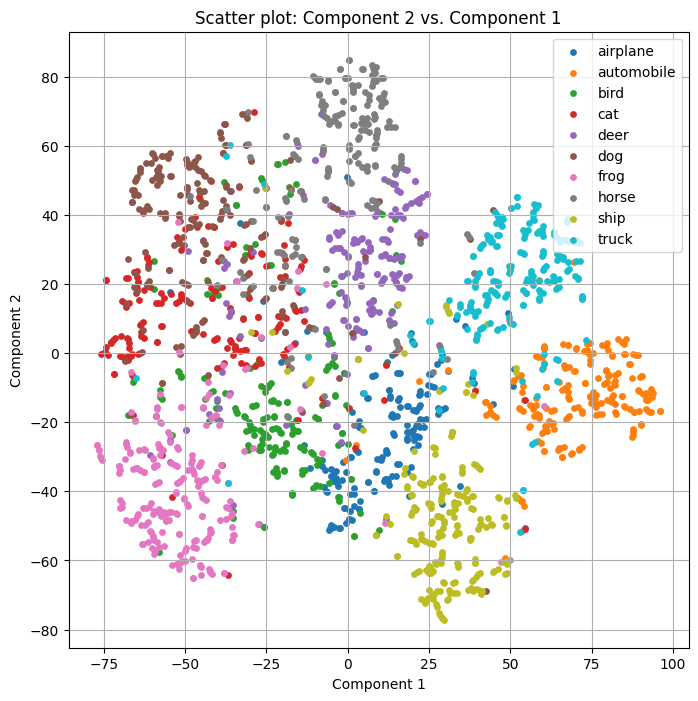

In [16]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2, perplexity=5).fit_transform(features)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)
# plt.show(fig)

**Assignment**: Explain what is a feature vector (hint: other terms in the literature are "Encodings", "Embeddings")

A feature vector is a $n$-dimensional vector of features, such as individual measurable property or characteristic, representing an object. In Machine Learning, feature vectors are required for algorithms and techniques such as linear regression and neural networks, to represent the object. So, it allow conducting statstical analysis and making predictions.

**Assignment**: Try out several perplexities: 5, 10, 30. What do you observe?

**ANSWER**

Comparing the images, the perplexity equals to $30$ provides a better separation of the classes. For perplexities $5$ and $10$ the points of the same class seems to be less homogeneosly separed as a group, as they are close to some neighbors of the same class and distant from others. The explaination has to be with the definition of perplexity, that essentially uses the $k$ nearest neighbors on the tSNE algorithm. As a consequence, while with more neighbors, all the points in the same class are plotted uniformly close to each other, and small groups are formed in the contrary way.






Perplexity: 5


<ipython-input-13-d8b5400c82b3>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


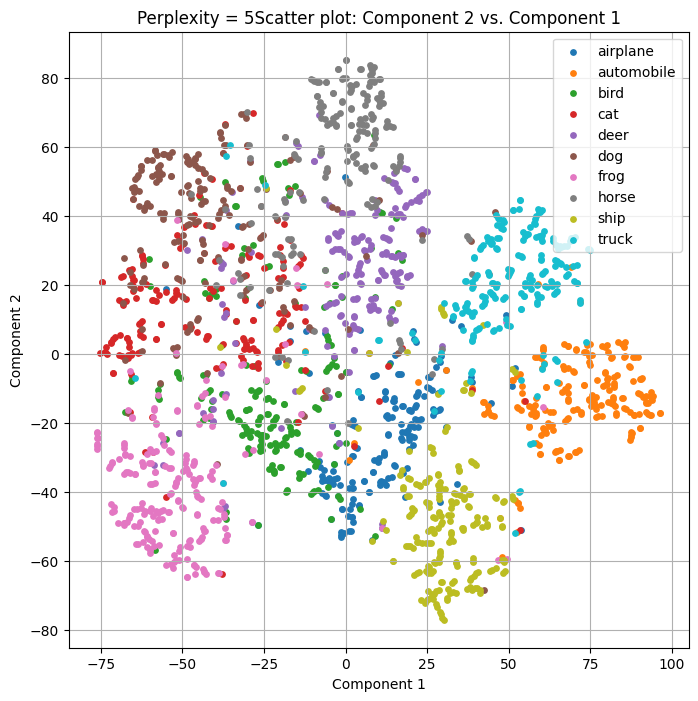

In [17]:
perplexity = 5
X_embedded = TSNE(n_components=2, perplexity=perplexity).fit_transform(features)
print(f"Perplexity: {perplexity}")
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition, title=f"Perplexity = {perplexity}")


Perplexity: 10


<ipython-input-13-d8b5400c82b3>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


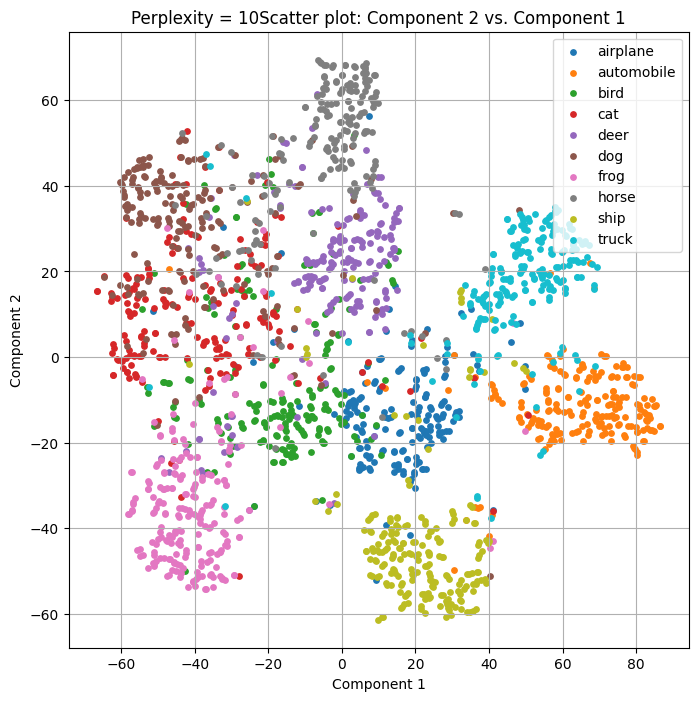

In [18]:
perplexity = 10
X_embedded = TSNE(n_components=2, perplexity=perplexity).fit_transform(features)
print(f"Perplexity: {perplexity}")
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition, title=f"Perplexity = {perplexity}")

Perplexity: 30


<ipython-input-13-d8b5400c82b3>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


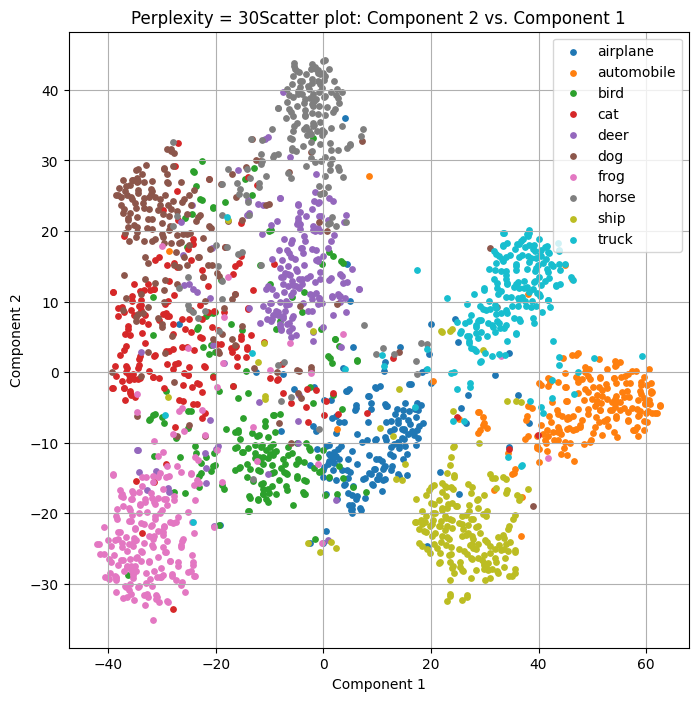

In [19]:
perplexity = 30
X_embedded = TSNE(n_components=2, perplexity=perplexity).fit_transform(features)
print(f"Perplexity: {perplexity}")
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition, title=f"Perplexity = {perplexity}")

Comparing the images, the perplexity equals to $30$ provides a better separation of the classes. For perplexities $5$ and $10$ the points of the same class seems to be less homogeneosly separed as a group, as they are close to some neighbors of the same class and distant from others. The explaination has to be with the definition of perplexity, that essentially uses the $k$ nearest neighbors on the tSNE algorithm. As a consequence, while with more neighbors, all the points in the same class are plotted uniformly close to each other, and small groups are formed in the contrary way.






**Assignment**: Visualize now the embeddings at the two fully connected layers. Why are the representations so strikingly different? Imagine you would like to use the same representations in another project (same image size, but other classes). Which of the representations seems less useful? Why?

**Answer**

After running the code in the cells **bellow**, we can conclude that there are fundamental differences between the images, due to the position of the layers where in the NN. The first embedding leayer shows representations are more dispersed, and the clusters are less defined. Thus, the embeddings of the second classifier seems to have a better separation.

For transfer learning, embedding 1 representations are more useful, as this layer is more generalized and less task-specific (it hasn’t yet specialized for the current task). It captures broader feature representations, which are more useful for transferring to another project with similar image sizes but different classes. Representations from embedding 2, while highly optimized for the current task, is less likely to generalize well to new classes.

In [20]:
features = []
embeddings = []
embeddings2 = []
y = []
for data in val_loader:
  x_batch, y_batch = data
  y.append(y_batch)
  with torch.no_grad():
    features_batch = model.features(x_batch.to(device))
    classifier_1st = model.classifier[:2](features_batch)
    classifiers_2nd = model.classifier[2:](classifier_1st)
  features.append(features_batch.cpu())
  embeddings.append(classifier_1st.cpu())
  embeddings2.append(classifiers_2nd.cpu())

features = torch.vstack(features).numpy()
embeddings = torch.vstack(embeddings).numpy()
embeddings2 = torch.vstack(embeddings2).numpy()
y = torch.hstack(y).numpy()

idxs_sampled = np.random.choice(np.arange(len(features)), 2000, replace=False)
features = features[idxs_sampled]
embeddings = embeddings[idxs_sampled]
embeddings2 = embeddings2[idxs_sampled]
y = y[idxs_sampled]

<ipython-input-13-d8b5400c82b3>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


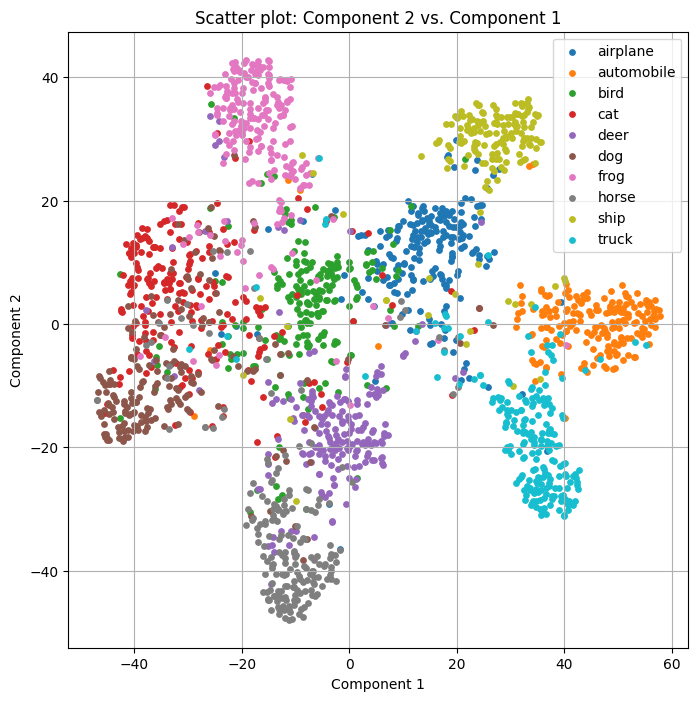

In [21]:
from sklearn.manifold import TSNE
X_embeddeding1 = TSNE(n_components=2, perplexity=30).fit_transform(embeddings)
make_scatterplot(X_embeddeding1, y.flatten(), class_definition=class_definition)

<ipython-input-13-d8b5400c82b3>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


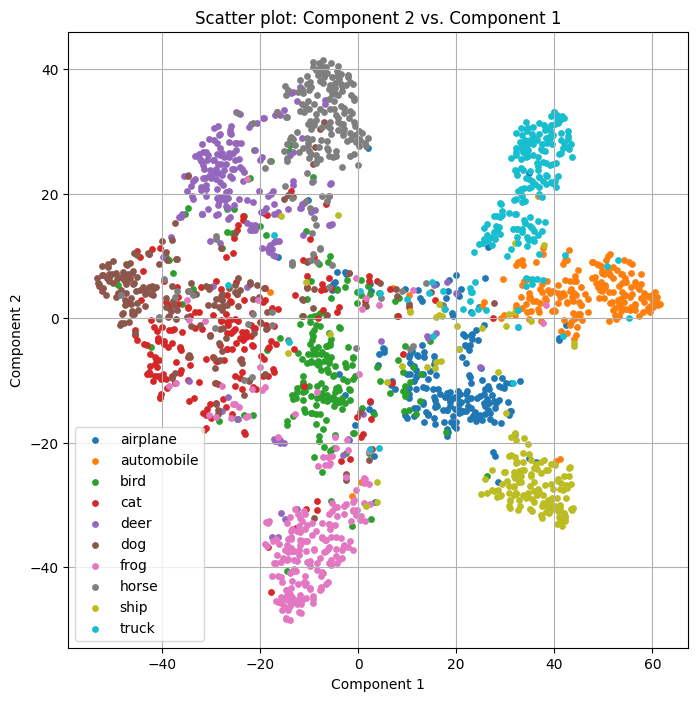

In [22]:
from sklearn.manifold import TSNE
X_embeddeding2 = TSNE(n_components=2, perplexity=30).fit_transform(embeddings2)
make_scatterplot(X_embeddeding2, y.flatten(), class_definition=class_definition)

**Assignment**: Visualize the tSNE plot of the model before training, what do you observe? (flatten layer and last fully_connected layer)

**Answer**

According to the plots provided below, both layers, before training, exhibit a lack of structure and no clear differentiation between classes, as expected in an untrained model.
- In the flaten layer, it is possible to notice that data seems to occupy a circular distribution, which may be a result of random initialization and the flattening operation.

<ipython-input-13-d8b5400c82b3>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]
<ipython-input-13-d8b5400c82b3>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


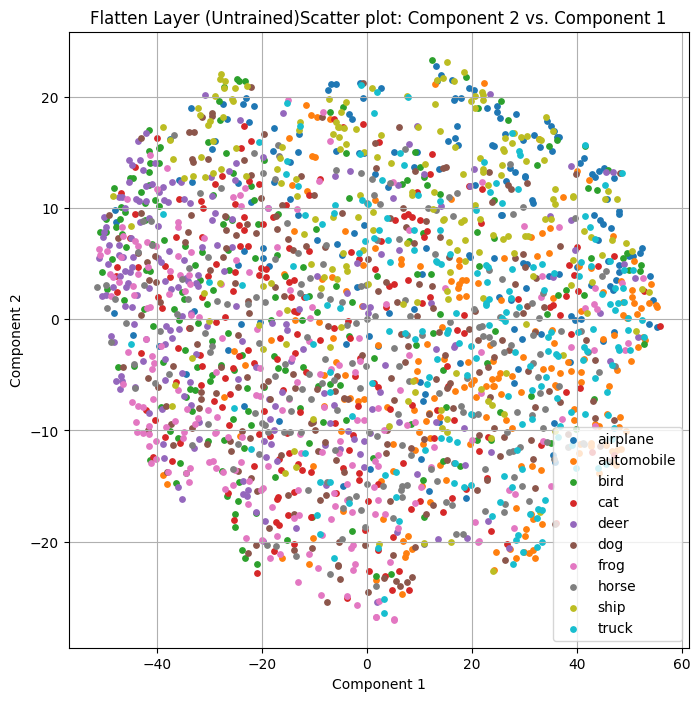

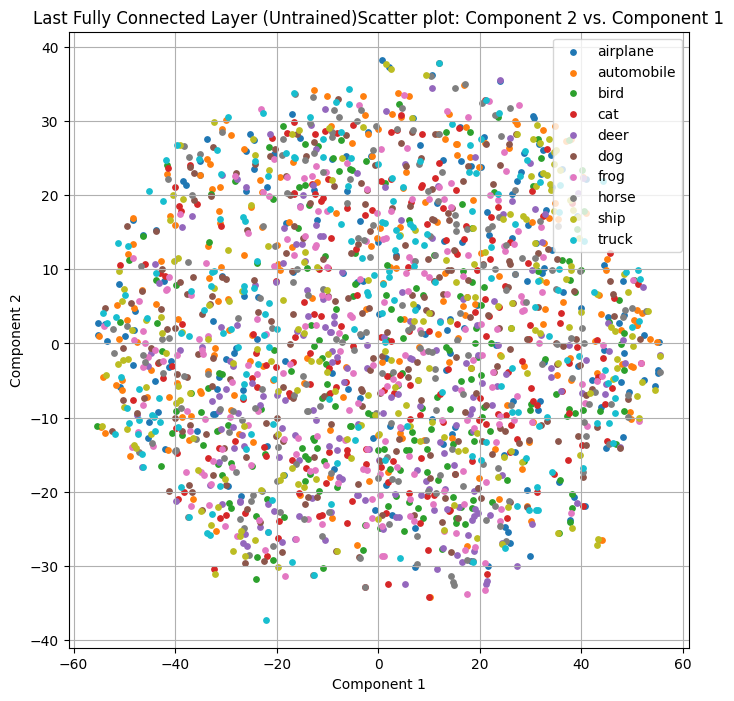

In [23]:
# Initialize a new model
untrained_model = CNNModel().to(device)

# Extract features and embeddings before training
features_untrained = []
embeddings_untrained = []
embeddings2_untrained = []
y_untrained = []
for data in val_loader:
    x_batch, y_batch = data
    y_untrained.append(y_batch)
    with torch.no_grad():
        features_batch = untrained_model.features(x_batch.to(device))
        classifier_1st = untrained_model.classifier[:2](features_batch)
        classifiers_2nd = untrained_model.classifier[2:](classifier_1st)
    features_untrained.append(features_batch.cpu())
    embeddings_untrained.append(classifier_1st.cpu())
    embeddings2_untrained.append(classifiers_2nd.cpu())

features_untrained = torch.vstack(features_untrained).numpy()
embeddings_untrained = torch.vstack(embeddings_untrained).numpy()
embeddings2_untrained = torch.vstack(embeddings2_untrained).numpy()
y_untrained = torch.hstack(y_untrained).numpy()

idxs_sampled = np.random.choice(np.arange(len(features_untrained)), 2000, replace=False)
features_untrained = features_untrained[idxs_sampled]
embeddings_untrained = embeddings_untrained[idxs_sampled]
embeddings2_untrained = embeddings2_untrained[idxs_sampled]
y_untrained = y_untrained[idxs_sampled]

# Perform t-SNE and plot for flatten layer
X_embedded_flatten_untrained = TSNE(n_components=2, perplexity=30).fit_transform(features_untrained)
make_scatterplot(X_embedded_flatten_untrained, y_untrained.flatten(), class_definition=class_definition, title="Flatten Layer (Untrained)")

# Perform t-SNE and plot for last fully connected layer
X_embedded_fc_untrained = TSNE(n_components=2, perplexity=30).fit_transform(embeddings2_untrained)
make_scatterplot(X_embedded_fc_untrained, y_untrained.flatten(), class_definition=class_definition, title="Last Fully Connected Layer (Untrained)")

# Classification activation maps (grad-CAM)

Classification activation maps provide certainly the most popular visualization methods for network inspection.

In [24]:
import torch
import matplotlib.pyplot as plt


device = "cuda" if torch.cuda.is_available() else "cpu"

In [25]:
!pip install gdown
!gdown --id 1-ypc0JK1Hp4d3dfO6eq0mPcx669PthXw --output /content/imagenet.zip
!unzip -q /content/imagenet.zip
!rm /content/imagenet.zip

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1-ypc0JK1Hp4d3dfO6eq0mPcx669PthXw
To: /content/imagenet.zip
100% 1.72M/1.72M [00:00<00:00, 121MB/s]


In [26]:
!pip install torchcam --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.0 MB/s eta 0:00:00


Next, we will load VGG16, pretrained on `ImageNet`. This is the network we are going to investigate.

In [27]:
from torchvision import models
import torch.nn.functional as F

torch.cuda.empty_cache()
model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
model = model.eval().to(device)

labels_names = models.VGG16_Weights.IMAGENET1K_V1.meta["categories"]

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:06<00:00, 85.2MB/s]


Now, we load an image from the `ImageNet` data base. We have downloaded these images: they are in the folder `imagenet`.

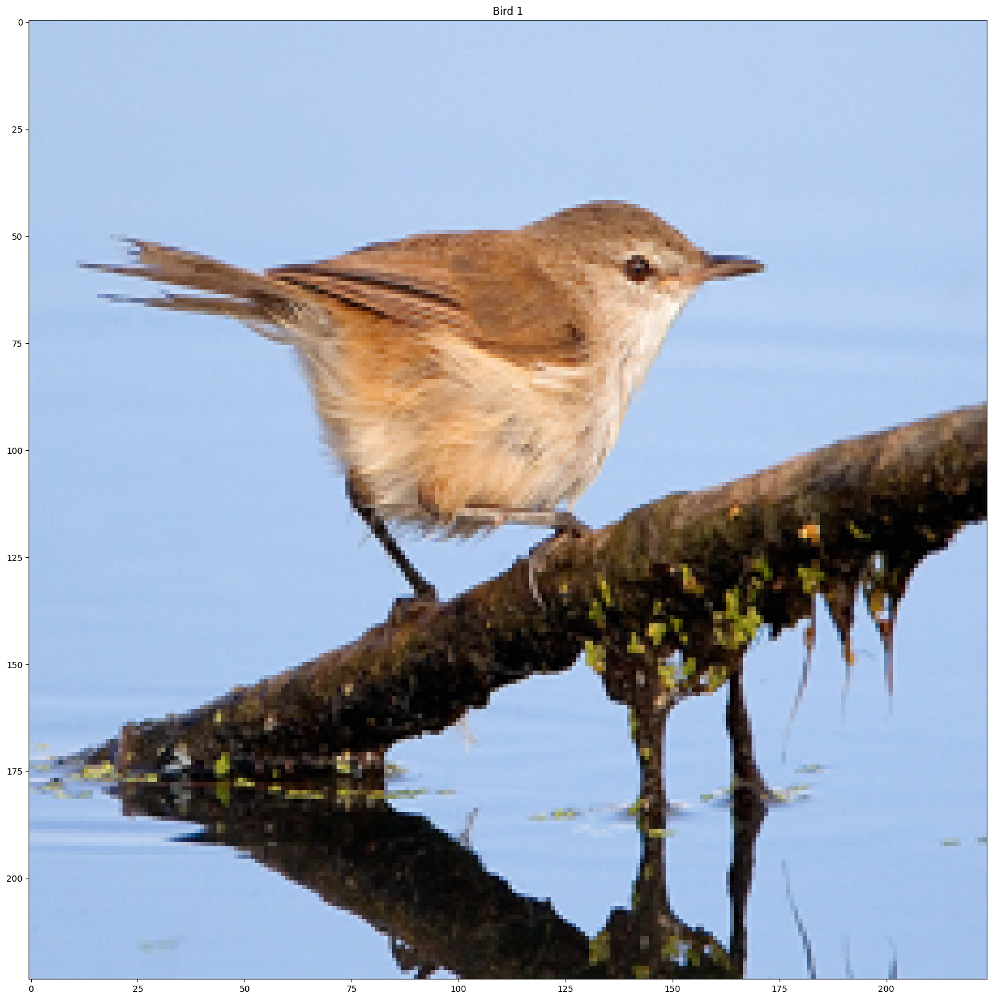

In [28]:
import os
from PIL import Image

filename = '418657219_3567961db1.jpg'
folder_name = '/content/imagenet'

# animals:
# bird : filename = '418657219_3567961db1.jpg'
# dog : filename = '425248370_b15374000e.jpg'
# bird : filename = '485627874_8f4144223a.jpg'

# bridges:
# filename = 'bridge1.jpg'
# filename = 'bridge2.jpg'
# filename = 'bridge3.jpg'

image = Image.open(os.path.join(folder_name, filename)).resize((224, 224))
plt.title('Bird 1')
plt.imshow(image)


Now, we will predict the label of the image.

In [29]:
from torchvision import transforms


preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])  # Normalize to match ImageNet
])

img_prep = preprocess(image)
img_prep = img_prep.unsqueeze(0)

with torch.no_grad():
    img_prediction = model(img_prep.to(device))

# Get probabilities by applying softmax to the output
probs = F.softmax(img_prediction, dim=1)

# Convert the probabilities to a numpy array and get the top 3 predictions
top_probs, top_indices = torch.topk(probs, 3, dim=1)
top_probs = top_probs.squeeze().cpu().numpy()
top_indices = top_indices.squeeze().cpu().numpy()

for i in range(3):
    label = labels_names[top_indices[i]]
    print(f"{label}: {top_probs[i] * 100:.2f}%")

# Get the solution index with the maximum probability
max_index = top_indices[0]
print('Predicted Index:', max_index)

water ouzel: 97.20%
jay: 0.65%
red-backed sandpiper: 0.64%
Predicted Index: 20


We will use the [Grad-Cam++](https://arxiv.org/pdf/1710.11063) implementation from torch-cam https://github.com/frgfm/torch-cam

Note that the output of the model needs to be the the logits and not probabilities (default behaviour in torchvision mdeols). The reason is that with `softmax` we cannot study the influence of neurons on the output $y_k$, if the output depends on all classes (which is the case when we use `softmax`).

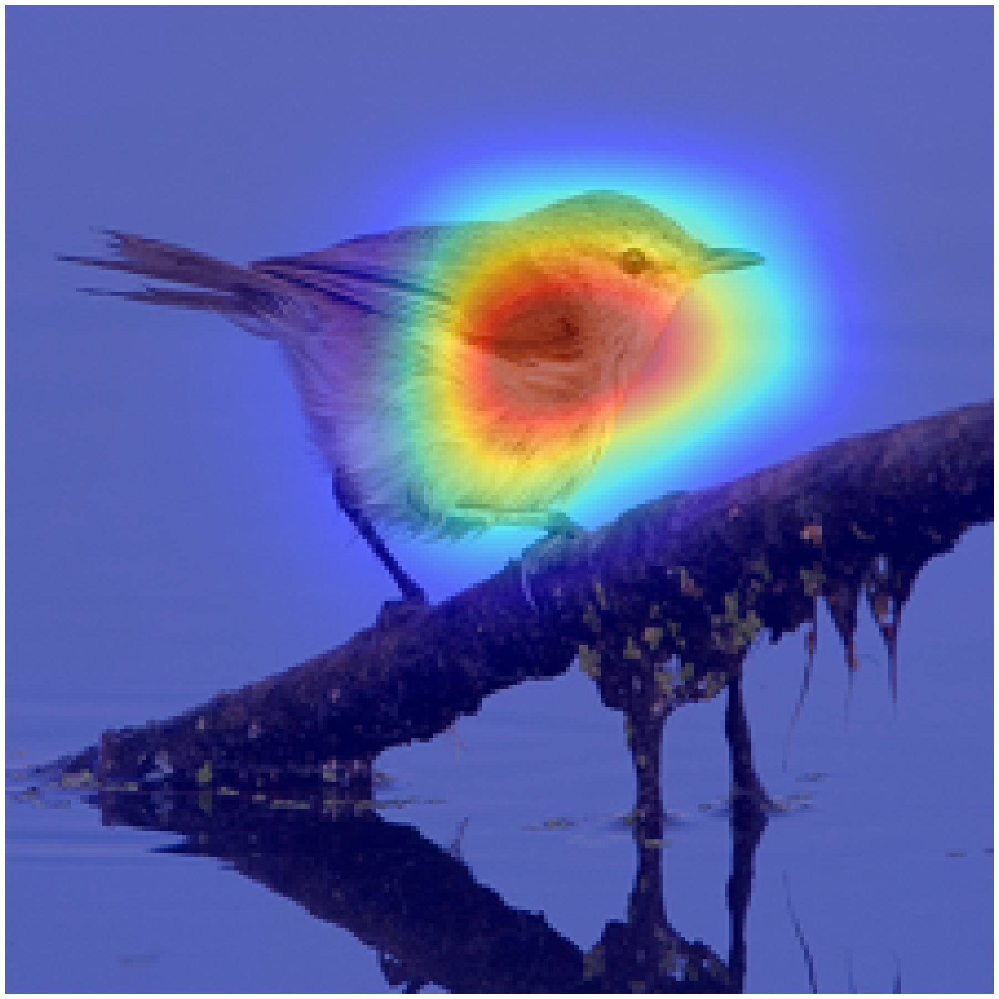

In [30]:
from torchcam.methods import GradCAMpp
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image


img_prep = preprocess(image)
img_prep = img_prep.unsqueeze(0)

with GradCAMpp(model) as cam_extractor:
    # Preprocess your data and feed it to the model
    out = model(img_prep.to(device))
    # Retrieve the CAM by passing the class index and the model output
    activation_map = cam_extractor(out.squeeze(0).argmax().item(), out)

# Resize the CAM and overlay it
result = overlay_mask(image, to_pil_image(activation_map[0].squeeze(0), mode='F'), alpha=0.5)
# Display it
plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

**Assignment:** Test the grad-CAM first on the three animal images, and verify that you obtain a reasonable result. Then test the algorithm on the three bridge images. Visualize the top-3 predictions.(Make a nice plot with the results)

*   For `Bridge1.jpg` you obtain a wrong classification, but what can be said about the learned network in view of the visualization of the top-3 predictions?
*   For `Bridge3.jpg` you get the right result, but what can you say about the "understanding" of the image in view of your visualization result?

Note that the correspondence of class names and indices can be found at:
[ImageNet](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a)


**ANSWER**

According to the plot below, indeed bridge 1 is indeed wrongly classified as schooner.

- For bridge 1, the visualization highlights regions of the image corresponding to incorrect predictions. As indicated by the heatmap, the network’s focus might emphasize specific architectural features like curves or reflections, common on similar visual elements, such as schooners.
- For bridge 3, "suspension bridge" is a class detected by the network. Indeed, the cables and walkway are highlighted by the heatmap, revealing that the network is effective for this particular example.

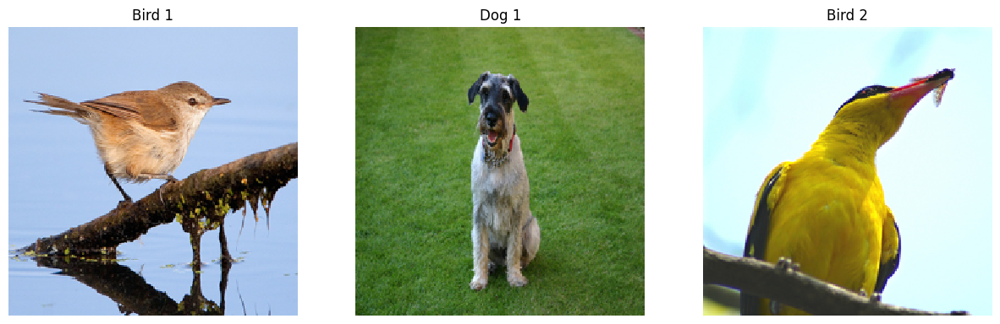

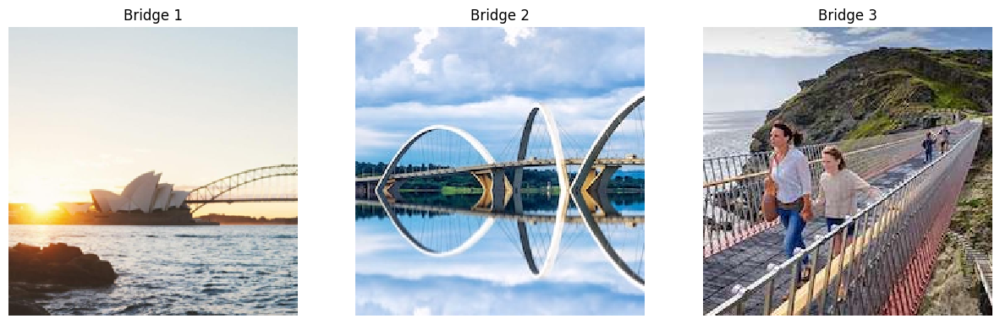

In [31]:
import os
from PIL import Image
from torchvision import transforms
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt

folder_name = '/content/imagenet'


animal_file_names = ['418657219_3567961db1.jpg', '425248370_b15374000e.jpg', '485627874_8f4144223a.jpg']
animal_names = ['Bird 1', 'Dog 1', 'Bird 2']

bridge_file_names = ['bridge1.jpg', 'bridge2.jpg', 'bridge3.jpg']
bridge_names = ['Bridge 1', 'Bridge 2', 'Bridge 3']

# make a 1x3 grid with animal images
fig = plt.figure(figsize=(15, 5))
for i in range(3):
    ax = fig.add_subplot(1, 3, i + 1)
    image = Image.open(os.path.join(folder_name, animal_file_names[i])).resize((224, 224))
    ax.set_title(animal_names[i])
    ax.imshow(image)
    ax.axis('off')
plt.show()

# make a 1x3 grid with bridge images
fig = plt.figure(figsize=(15, 5))
for i in range(3):
    ax = fig.add_subplot(1, 3, i + 1)
    image = Image.open(os.path.join(folder_name, bridge_file_names[i])).resize((224, 224))
    ax.set_title(bridge_names[i])
    ax.imshow(image)
    ax.axis('off')


Bird 1 - water ouzel: 97.20%
Bird 1 - jay: 0.65%
Bird 1 - red-backed sandpiper: 0.64%
Dog 1 - standard schnauzer: 72.13%
Dog 1 - miniature schnauzer: 20.36%
Dog 1 - giant schnauzer: 3.52%
Bird 2 - bee eater: 81.24%
Bird 2 - macaw: 13.22%
Bird 2 - bulbul: 1.88%


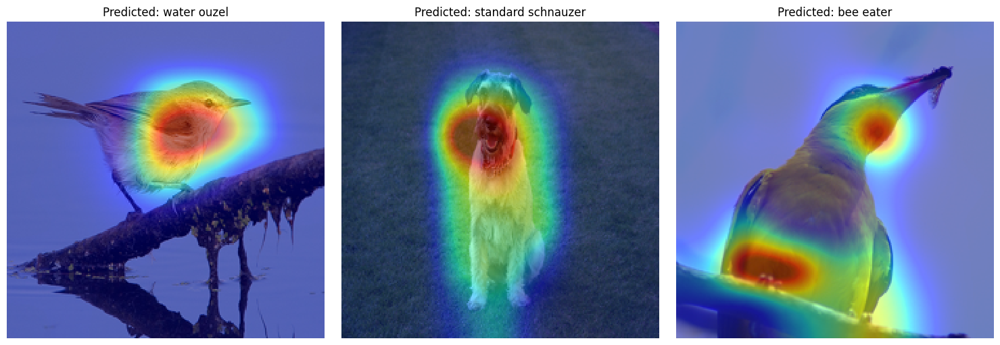

In [32]:
animal_file_names = ['418657219_3567961db1.jpg', '425248370_b15374000e.jpg', '485627874_8f4144223a.jpg']
animal_names = ['Bird 1', 'Dog 1', 'Bird 2']

bridge_file_names = ['bridge1.jpg', 'bridge2.jpg', 'bridge3.jpg']
bridge_names = ['Bridge 1', 'Bridge 2', 'Bridge 3']

preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])  # Normalize to match ImageNet
])


def plot_grad_cam(file_names, names, title):

  fig, axes = plt.subplots(1, 3, figsize=(15, 5))
  for i, (file_name, name) in enumerate(zip(file_names, names)):

      image = Image.open(os.path.join(folder_name, file_name)).resize((224, 224))
      img_prep = preprocess(image)
      img_prep = img_prep.unsqueeze(0)

      with torch.no_grad():
          img_prediction = model(img_prep.to(device))

      # Get probabilities by applying softmax to the output
      probs = F.softmax(img_prediction, dim=1)

      # Convert the probabilities to a numpy array and get the top 3 predictions
      top_probs, top_indices = torch.topk(probs, 3, dim=1)
      top_probs = top_probs.squeeze().cpu().numpy()
      top_indices = top_indices.squeeze().cpu().numpy()

      for j in range(3):
          label = labels_names[top_indices[j]]
          print(f"{name} - {label}: {top_probs[j] * 100:.2f}%")

      # Get the solution index with the maximum probability
      max_index = top_indices[0]

      with GradCAMpp(model) as cam_extractor:
          # Preprocess your data and feed it to the model
          out = model(img_prep.to(device))
          # Retrieve the CAM by passing the class index and the model output
          activation_map = cam_extractor(out.squeeze(0).argmax().item(), out)

      # Resize the CAM and overlay it
      result = overlay_mask(image, to_pil_image(activation_map[0].squeeze(0), mode='F'), alpha=0.5)

      # Display it
      axes[i].imshow(result)
      axes[i].set_title(f"Predicted: {labels_names[top_indices[0]]}")
      axes[i].axis('off')

  plt.tight_layout()
  plt.show()

plot_grad_cam(animal_file_names, animal_names, "Animal Images")


Bridge 1 - schooner: 27.15%
Bridge 1 - pier: 10.60%
Bridge 1 - wreck: 9.71%
Bridge 2 - steel arch bridge: 66.78%
Bridge 2 - bicycle-built-for-two: 6.95%
Bridge 2 - sunglasses: 5.86%
Bridge 3 - suspension bridge: 71.03%
Bridge 3 - pier: 13.15%
Bridge 3 - dam: 5.00%


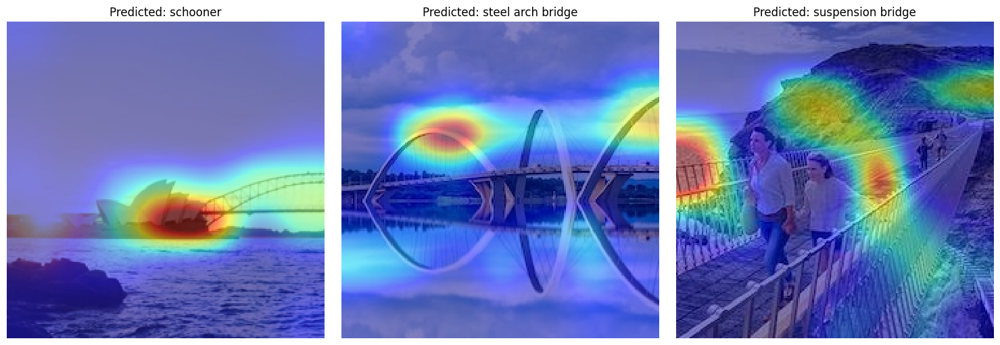

In [33]:
plot_grad_cam(bridge_file_names, bridge_names, "Bridge Images")


# Activation Maximization

So far, we visualized activations of images, i.e. we focused on visualizations of inner network representations for given image data.

We can also visualize properties of the network itself. A popular method is the activation maximization, where we seek an image that would maximize a given neuron inside the network.

For this, we solve the maximization problem:
\begin{equation}
x^{\ast} = {\arg \max}_{x} z(x)
\end{equation}
where $z(x)$ is the value of an arbitrary neuron (or a set of neurons, e.g. the neurons in one feature map) in the network.

Typically, $z(x)=S_c(x)$ is the value of the output layer for one particular class. We therefore seek the image that maximizes the output for a particular class (e.g. the output for `water_ouzel`, `index: 20`).

More information here: https://distill.pub/2017/feature-visualization/

In [34]:
#@title Maximum activation visualization functions

# Inspired from  tf-keras-vis https://github.com/keisen/tf-keras-vis/blob/c793148ff6bc97d03880b107b958fb9c4f87efc5/tf_keras_vis/activation_maximization/__init__.py#L17

import torch.nn as nn
import numpy as np


class TotalVariation2D(nn.Module):
    """A regularizer that introduces Total Variation."""

    def __init__(self, weight=10.0, name='TotalVariation2D'):
        """
        Args:
            weight: This value will be applied to TotalVariation values.
                Defaults to 10.0.
            name : Instance name.
                Defaults to 'TotalVariation2D'.
        """
        super(TotalVariation2D, self).__init__()
        self.weight = float(weight)

    def forward(self, input_value):
        if len(input_value.shape) != 4:
            raise ValueError("Input shape must be (batch_size, channels, height, width), "
                             f"but was {input_value.shape}.")

        # Calculate total variation
        tv = torch.sum(torch.abs(input_value[:, :, 1:, :] - input_value[:, :, :-1, :])) + \
             torch.sum(torch.abs(input_value[:, :, :, 1:] - input_value[:, :, :, :-1]))

        # Normalize by the number of elements and apply weight
        tv /= float(input_value.shape[1] * input_value.shape[2] * input_value.shape[3])
        tv *= self.weight
        return tv


class Norm(nn.Module):
    """A regularizer that introduces Norm."""

    def __init__(self, weight=10.0, p=2, name='Norm'):
        """
        Args:
            weight: This weight will be applied to the norm values.
                Defaults to 10.
            p: Order of the norm. Defaults to 2.
            name: Instance name. Defaults to 'Norm'.
        """
        super(Norm, self).__init__()
        self.weight = float(weight)
        self.p = int(p)

    def forward(self, input_value):
        # Reshape to (batch_size, -1) for calculating norm
        reshaped_input = input_value.view(input_value.shape[0], -1)

        # Compute the norm along the specified dimension
        norm = torch.norm(reshaped_input, p=self.p, dim=1)

        # Normalize without in-place operations
        norm = norm / (reshaped_input.shape[1] ** (1.0 / float(self.p)))
        norm = norm * self.weight

        # Return the norm as a scalar by taking the mean
        return norm.mean()


class Jitter:
    """An input modifier that introduces random jitter.
       Jitter has been shown to produce crisper activation maximization images.
    """

    def __init__(self, jitter=8):
        """
        Args:
            jitter: The amount of jitter to apply. Defaults to 8.
        """
        self.jitter = int(jitter)

    def __call__(self, seed_input):
        ndim = len(seed_input.shape)
        if ndim < 3:
            raise ValueError("The dimensions of seed_input must be 3 or more "
                             f"(batch_size, ..., channels), but was {ndim}.")

        # Generate random shifts within the jitter range for each spatial dimension
        shifts = tuple(np.random.randint(-self.jitter, self.jitter) for _ in range(ndim - 2))
        axes = tuple(range(1, ndim - 1))  # Apply shifts to all spatial dimensions

        # Apply torch.roll to create jitter
        seed_input = torch.roll(seed_input, shifts=shifts, dims=axes)

        return seed_input


class Rotate2D:
    """An input modifier for 2D that introduces random rotation."""

    def __init__(self, degree=3.0):
        """
        Args:
            degree: The maximum degree of rotation to apply.
        """
        self.degree = float(degree)
        self.random_generator = np.random.default_rng()

    def __call__(self, seed_input):
        # Check input dimensions
        if len(seed_input.shape) != 4:
            raise ValueError("Input shape must be (batch_size, channels, height, width), "
                             f"but was {seed_input.shape}.")

        # Get a random rotation angle within the specified range
        angle = self.random_generator.uniform(-self.degree, self.degree)

        # Rotation requires transformation matrix
        theta = torch.tensor([
            [torch.cos(torch.tensor(angle * np.pi / 180)), -torch.sin(torch.tensor(angle * np.pi / 180)), 0],
            [torch.sin(torch.tensor(angle * np.pi / 180)),  torch.cos(torch.tensor(angle * np.pi / 180)), 0]
        ], dtype=seed_input.dtype, device=seed_input.device)

        # Expand to a batch of transformation matrices
        theta = theta.unsqueeze(0).repeat(seed_input.size(0), 1, 1)

        # Create affine grid for rotation and apply it with grid_sample
        grid = F.affine_grid(theta, seed_input.size(), align_corners=False)
        rotated_input = F.grid_sample(seed_input, grid, align_corners=False, padding_mode='reflection')

        return rotated_input



class ActivationMaximization:
    def __init__(self, model, lr=5e-2, plot_iterations=100):
        """
        Args:
            model: The neural network model.
            neuron_index: Index of the neuron to visualize.
            input_shape: Shape of the input image. Defaults to (224, 224).
            lr: Learning rate for optimization. Defaults to 5e-2.
            tv_loss_weight: Weight for the total variation loss. Defaults to 1e-5.
            num_iterations: Number of iterations for activation maximization. Defaults to 4000.
            plot_iterations: Number of iterations between plot updates. Defaults to 100.
        """
        self.model = model
        self.lr = lr
        self.total_var = TotalVariation2D(weight=5.)
        self.norm = Norm(weight=1.)
        self.jitter_transform = Jitter(jitter=4)
        self.rotate = Rotate2D(degree=1.)
        self.plot_iterations = plot_iterations
        self.to_pil = transforms.ToPILImage()

        device = "cuda" if torch.cuda.is_available() else "cpu"
        self.mean_imagenet = torch.tensor([0.485, 0.456, 0.406]).view((1, 3, 1, 1)).to(device)
        self.std_imagenet = torch.tensor([0.229, 0.224, 0.225]).view((1, 3, 1, 1)).to(device)

    @staticmethod
    def total_variation_loss(x):
        """Calculates the total variation loss for an input tensor."""
        tv_loss = torch.sum(torch.abs(x[:, :, 1:, :] - x[:, :, :-1, :])) + \
                  torch.sum(torch.abs(x[:, :, :, 1:] - x[:, :, :, :-1]))
        return tv_loss

    def apply_norm(self, x):
        """Applies normalization to the input tensor (if necessary)."""
        # Placeholder for normalization; adjust as needed for your model
        return (x - self.mean_imagenet) / self.std_imagenet

    def visualize(self, neuron_index, input_shape=(224, 224), num_iterations=2000):
        tensor_shape = (1, 3) + input_shape
        input_tensor = torch.randn(tensor_shape, requires_grad=True, device="cuda")
        #optimizer = torch.optim.Adam([input_tensor], lr=self.lr)
        optimizer = torch.optim.RMSprop([input_tensor], lr=self.lr, alpha=0.999)

        # Activation Maximization Loop
        for i in range(num_iterations):
            optimizer.zero_grad()

            # Forward pass for neuron activation
            with torch.no_grad():
                input_tensor.copy_(self.jitter_transform(input_tensor))
                input_tensor.copy_(self.rotate(input_tensor))
            neuron_activation = self.model(self.apply_norm(input_tensor))[..., neuron_index]
            activation_loss = -neuron_activation.mean()  # Negative to maximize

            # Total variation loss
            total_var = self.total_var(input_tensor)
            norm = self.norm(input_tensor)
            regularizer_loss = total_var + norm
            loss = activation_loss + regularizer_loss

            # Backward and optimize
            loss.backward()
            optimizer.step()

            # Clamp values to the display range [0, 1]
            input_tensor.data = torch.clamp(input_tensor.data, 0, 1)

            # Logging or visualization step
            if i % self.plot_iterations == 0:
                print(f"Iteration {i}/{num_iterations}, Activation: {-activation_loss.item()}, TotalVar: {total_var.item()}, TotalVar: {norm.item()}")

        # Display the final maximized image
        optimized_image = input_tensor.squeeze().cpu().detach().clamp(0, 1)
        plt.imshow(self.to_pil(optimized_image))
        plt.title(f"Activation Maximization for Neuron {neuron_index}")
        plt.axis("off")
        plt.show()

Iteration 0/2000, Activation: 1.1878161430358887, TotalVar: 8.936507225036621, TotalVar: 0.8387079238891602
Iteration 100/2000, Activation: 3.3203823566436768, TotalVar: 1.541111946105957, TotalVar: 0.5505855083465576
Iteration 200/2000, Activation: 8.256929397583008, TotalVar: 1.4043951034545898, TotalVar: 0.5455309748649597
Iteration 300/2000, Activation: 9.414205551147461, TotalVar: 1.1847283840179443, TotalVar: 0.5370197296142578
Iteration 400/2000, Activation: 27.760358810424805, TotalVar: 1.1599054336547852, TotalVar: 0.5382460951805115
Iteration 500/2000, Activation: 36.93156051635742, TotalVar: 1.1299042701721191, TotalVar: 0.5400141477584839
Iteration 600/2000, Activation: 61.25745391845703, TotalVar: 1.0987939834594727, TotalVar: 0.5390204787254333
Iteration 700/2000, Activation: 78.42987823486328, TotalVar: 1.0883123874664307, TotalVar: 0.5401050448417664
Iteration 800/2000, Activation: 109.80742645263672, TotalVar: 0.958041787147522, TotalVar: 0.536853015422821
Iteration 90

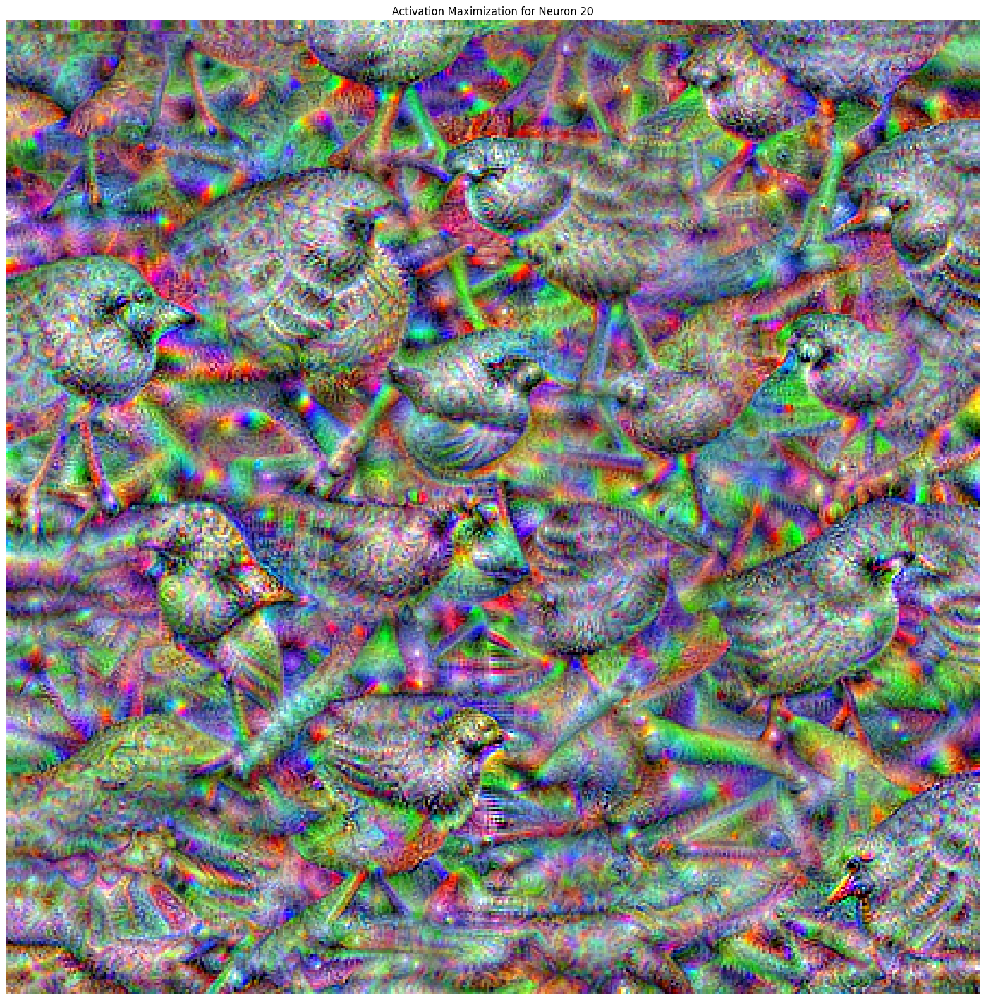

In [35]:
#neuron_index = labels_names.index("Indian elephant")
neuron_index = max_index

activation_maximization = ActivationMaximization(model)
activation_maximization.visualize(neuron_index, num_iterations=2000, input_shape=(448, 448))

**Assignment**: You might want to play with this, e.g. 385: Indian elephant, 2: great white shark, 555: fire truck

Other classes can be found at:
[ImageNet](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a)

**Answer**
It is interesting to see the common patterns being revelated in different positions, as exemplified by the elephant's trunk and horns.

Iteration 0/2000, Activation: 0.0827246904373169, TotalVar: 9.466712951660156, TotalVar: 0.8745645880699158
Iteration 100/2000, Activation: 13.586536407470703, TotalVar: 1.565873146057129, TotalVar: 0.555335283279419
Iteration 200/2000, Activation: 20.00058364868164, TotalVar: 1.4745419025421143, TotalVar: 0.5510050058364868
Iteration 300/2000, Activation: 70.72899627685547, TotalVar: 1.358725905418396, TotalVar: 0.54853355884552
Iteration 400/2000, Activation: 83.00350189208984, TotalVar: 1.1955206394195557, TotalVar: 0.5446856021881104
Iteration 500/2000, Activation: 103.13691711425781, TotalVar: 1.2992268800735474, TotalVar: 0.5501630902290344
Iteration 600/2000, Activation: 126.6540756225586, TotalVar: 1.2762975692749023, TotalVar: 0.5487344861030579
Iteration 700/2000, Activation: 144.3736572265625, TotalVar: 0.9969788789749146, TotalVar: 0.5442063212394714
Iteration 800/2000, Activation: 213.4647979736328, TotalVar: 0.9685839414596558, TotalVar: 0.5436267852783203
Iteration 900/2

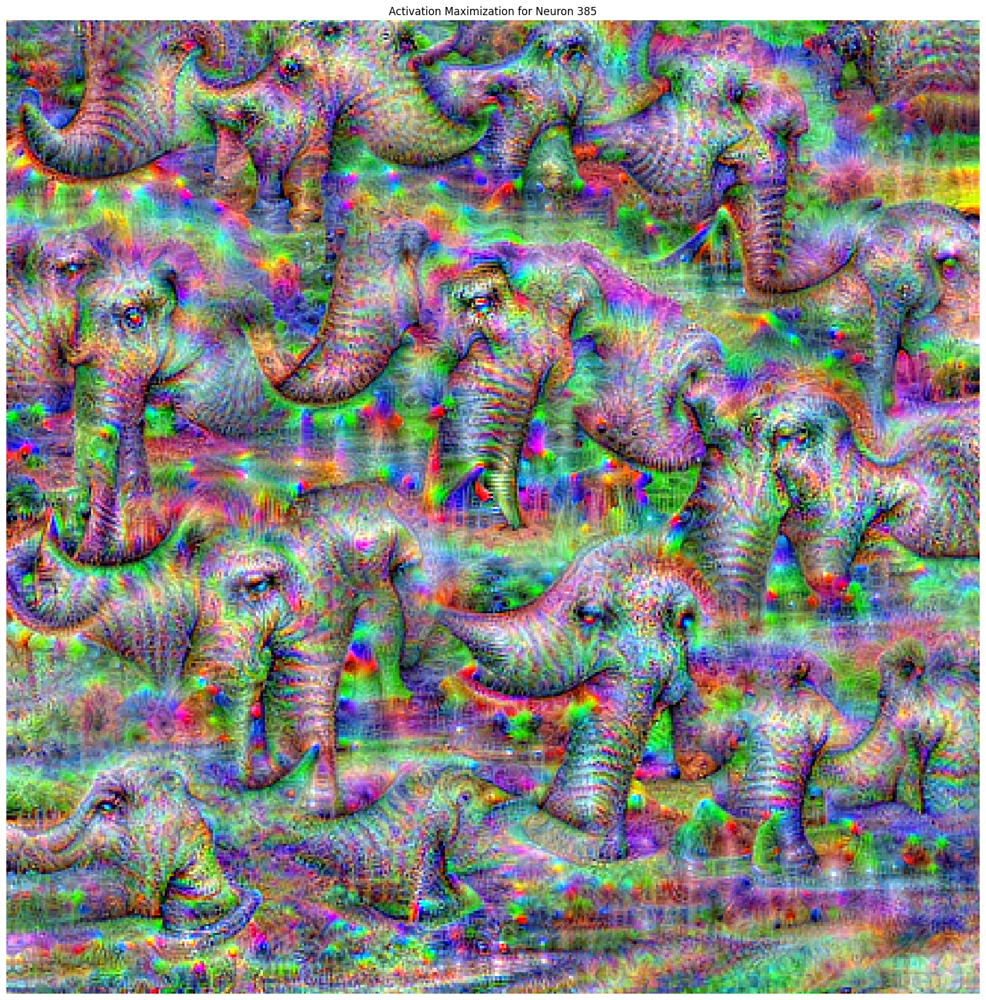

In [36]:
activation_maximization.visualize(385, num_iterations=2000, input_shape=(448, 448))

**Assignment:** Generate the activation maximization image the the same index, for a network initialized randomly. What do you observe?

Iteration 0/2000, Activation: -1.6004219055175781, TotalVar: 6.211880683898926, TotalVar: 0.6603271961212158
Iteration 100/2000, Activation: 3.46087384223938, TotalVar: 1.4617592096328735, TotalVar: 0.548640787601471
Iteration 200/2000, Activation: 12.466754913330078, TotalVar: 1.6731257438659668, TotalVar: 0.550869882106781
Iteration 300/2000, Activation: 15.933905601501465, TotalVar: 1.2032861709594727, TotalVar: 0.5359362363815308
Iteration 400/2000, Activation: 20.48462677001953, TotalVar: 1.1082042455673218, TotalVar: 0.529151439666748
Iteration 500/2000, Activation: 33.659305572509766, TotalVar: 1.0441659688949585, TotalVar: 0.5263769030570984
Iteration 600/2000, Activation: 29.85497283935547, TotalVar: 1.084652066230774, TotalVar: 0.5266435742378235
Iteration 700/2000, Activation: 52.321475982666016, TotalVar: 1.040627121925354, TotalVar: 0.5282717347145081
Iteration 800/2000, Activation: 98.96289825439453, TotalVar: 0.996662974357605, TotalVar: 0.5269550085067749
Iteration 900/

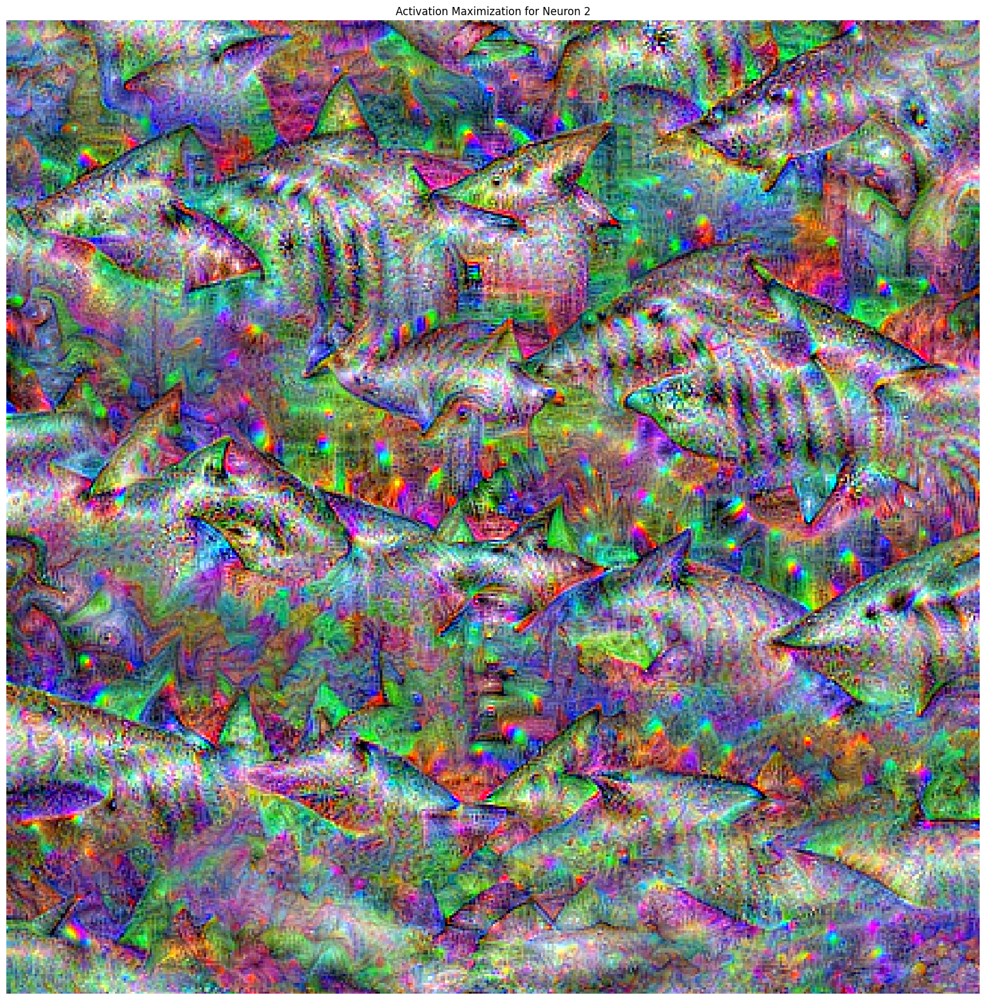

In [37]:
activation_maximization.visualize(2, num_iterations=2000, input_shape=(448, 448))

Iteration 0/2000, Activation: 0.5754687786102295, TotalVar: 6.14537239074707, TotalVar: 0.6567721962928772
Iteration 100/2000, Activation: 4.402671813964844, TotalVar: 1.600221872329712, TotalVar: 0.5526083111763
Iteration 200/2000, Activation: 13.497836112976074, TotalVar: 1.384347677230835, TotalVar: 0.5441163182258606
Iteration 300/2000, Activation: 21.483518600463867, TotalVar: 1.3466343879699707, TotalVar: 0.5431429743766785
Iteration 400/2000, Activation: 24.87013053894043, TotalVar: 1.1606839895248413, TotalVar: 0.5371325612068176
Iteration 500/2000, Activation: 50.9879150390625, TotalVar: 1.095447063446045, TotalVar: 0.5337021946907043
Iteration 600/2000, Activation: 73.81993865966797, TotalVar: 1.0597633123397827, TotalVar: 0.5307720303535461
Iteration 700/2000, Activation: 85.48455047607422, TotalVar: 1.1384499073028564, TotalVar: 0.5325194597244263
Iteration 800/2000, Activation: 86.97222900390625, TotalVar: 1.2644054889678955, TotalVar: 0.534843921661377
Iteration 900/2000,

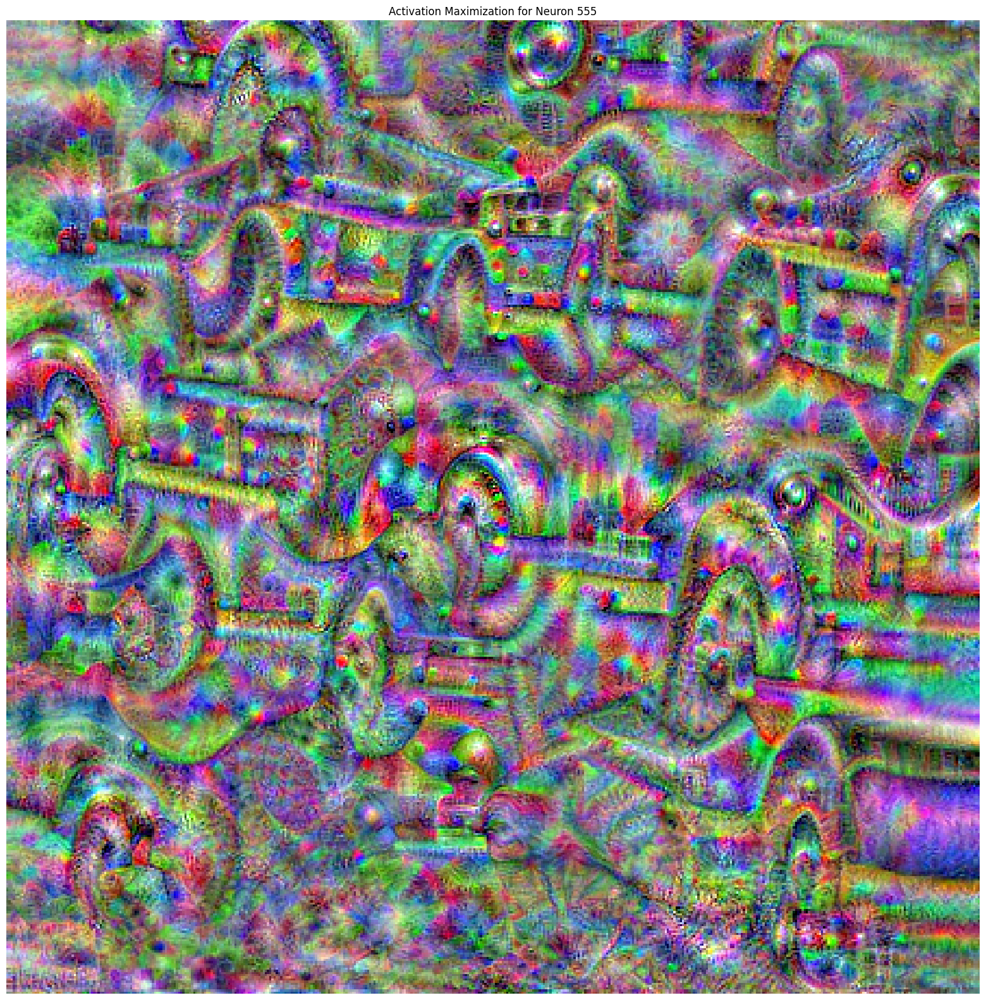

In [38]:
activation_maximization.visualize(555, num_iterations=2000, input_shape=(448, 448))

Iteration 0/2000, Activation: -0.7476611733436584, TotalVar: 6.14836311340332, TotalVar: 0.6575629115104675
Iteration 100/2000, Activation: 11.498113632202148, TotalVar: 1.630110740661621, TotalVar: 0.5553281307220459
Iteration 200/2000, Activation: 36.009735107421875, TotalVar: 1.3367353677749634, TotalVar: 0.5461658835411072
Iteration 300/2000, Activation: 41.52113723754883, TotalVar: 1.3591196537017822, TotalVar: 0.5474463701248169
Iteration 400/2000, Activation: 60.144710540771484, TotalVar: 1.1012300252914429, TotalVar: 0.53973788022995
Iteration 500/2000, Activation: 80.76335906982422, TotalVar: 1.1216766834259033, TotalVar: 0.5406187772750854
Iteration 600/2000, Activation: 94.21755981445312, TotalVar: 1.199225664138794, TotalVar: 0.5424992442131042
Iteration 700/2000, Activation: 139.22828674316406, TotalVar: 1.0036888122558594, TotalVar: 0.5377810597419739
Iteration 800/2000, Activation: 115.31788635253906, TotalVar: 0.9515550136566162, TotalVar: 0.5384709239006042
Iteration 9

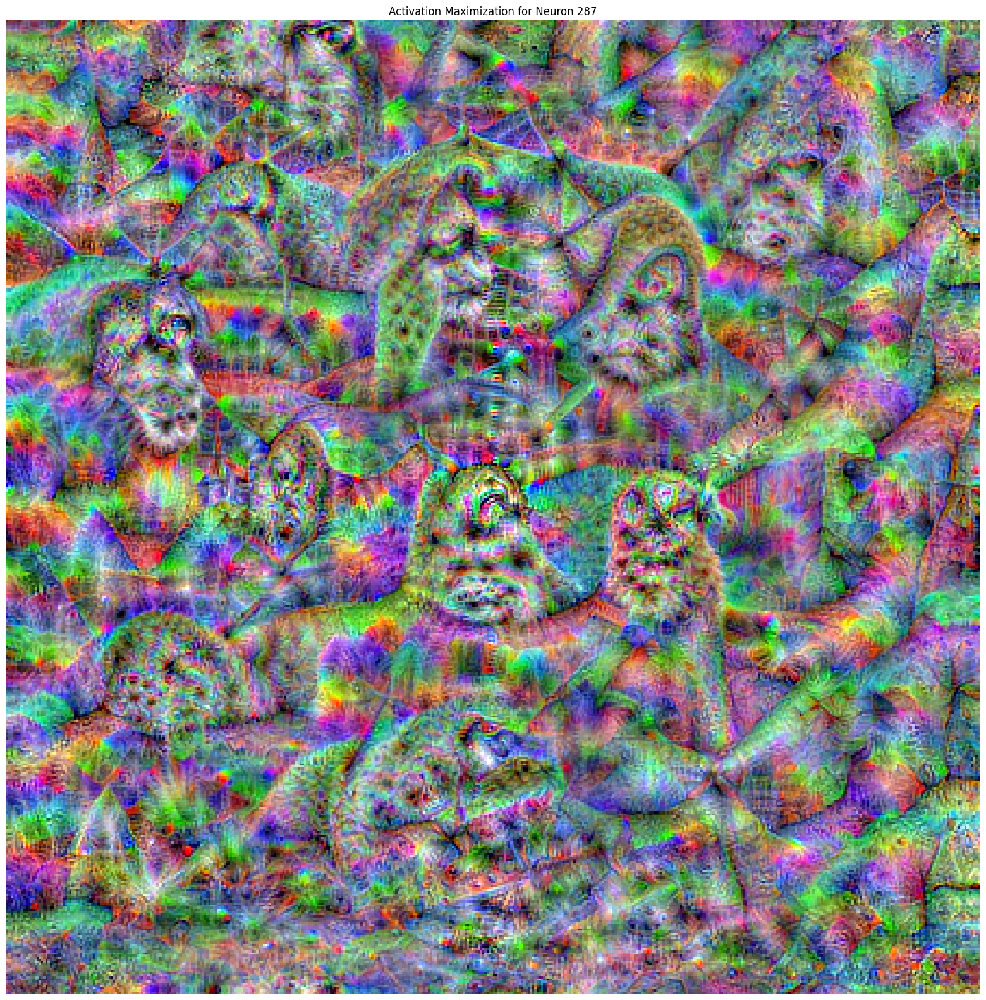

In [39]:
# lynx 287
activation_maximization.visualize(287, num_iterations=2000, input_shape=(448, 448))

# Bonus: Visualizing Attention of a ViT Model

The attention mechanism in Vision Transformers (ViT) allows the model to focus on different parts of the input image. The attention weights can be interpreted as a matrix that indicates how much focus the model puts on each part of the image when making predictions.

### Mathematical Formulation

Let $ A $ be the attention matrix derived from the self-attention mechanism of a transformer layer, where:

$$
A = \text{Softmax}\left(\frac{QK^T}{\sqrt{d_k}}\right)
$$

- $Q$ is the query matrix,
- $K$ is the key matrix,
- $d_k$ is the dimensionality of the keys.

The output of the attention layer is simply the dot product $AV$, where $V$ is the value matrix.


In [40]:
import cv2
from transformers import ViTForImageClassification, ViTFeatureExtractor

In [41]:
# Load the ViT model and feature extractor
modelvit = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')
modelvit.config.output_attentions = True

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


In [42]:
# Load and prepare the image
image_path = './imagenet/418657219_3567961db1.jpg'
image = Image.open(image_path)
inputs = feature_extractor(images=image, return_tensors="pt")

# Pass the image through the model
outputs = modelvit(**inputs)

`ViTSdpaAttention` is used but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


In [43]:
# Extract attention weights
attn_weights = outputs.attentions
attn_weights = torch.stack(attn_weights).squeeze(1)
attn_weights = torch.mean(attn_weights, dim=1) # Average across attention heads in Multi-attention Layers

# Check the shape of the attention weights
print("Shape of attention weights:", attn_weights.shape) # The model is composed of 12 Attention Layers

Shape of attention weights: torch.Size([12, 197, 197])


### Attention Rollout Process

To visualize the contributions of different layers to the final output, we perform an attention rollout.
At every Transformer block, we get an attention Matrix $(A)_{ij}$ that defines how much attention is going to flow from token j in the previous layer to token i in the next layer.
Attention rollout process involves recursively multiplying the attention matrices across multiple layers.
To account for the residual connections, we can add the identity matrix $I$ to the Attention matrices: $A + I$.

Let $A^{l}$ be the attention matrix from layer $l$. The rollout $R$ at layer $l$ is computed as follows:

1. Initialize $R^{0}$ as the attention matrix of the first layer:
   $$
   R^{0} = A^{0}
   $$

2. For each following layer $l$:
   $$
   R^{l} = (A^{l} + I) R^{l-1}
   $$
where $I$ is the Identity matrix.

Let $L$ denotes the index of the last layer. The final rollout $R^{L}_{0}$ can be interpreted as a joint attention representation that indicates how each token attends to every other token throughout the network.

$R^{L}$ can be normalized to obtain a mask:

$$
\text{mask} = \frac{R^{L}_{0}}{\max(R^{L}_{0})}
$$



In [44]:
# Add an identity matrix for bias
residual_att = torch.eye(attn_weights.size(1))
aug_att_mat = attn_weights + residual_att
aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

# Recursively multiply the weight matrices
rollout_attentions = torch.zeros(aug_att_mat.size())
rollout_attentions[0] = aug_att_mat[0]
for n in range(1, aug_att_mat.size(0)):
    rollout_attentions[n] = torch.matmul(aug_att_mat[n], rollout_attentions[n-1])

# Attention from the output to the input space
R = rollout_attentions[-1]
grid_size = int(np.sqrt(aug_att_mat.size(-1)))
mask = R[0, 1:].reshape(grid_size, grid_size).detach().numpy()
mask = cv2.resize(mask / mask.max(), image.size)[..., np.newaxis]


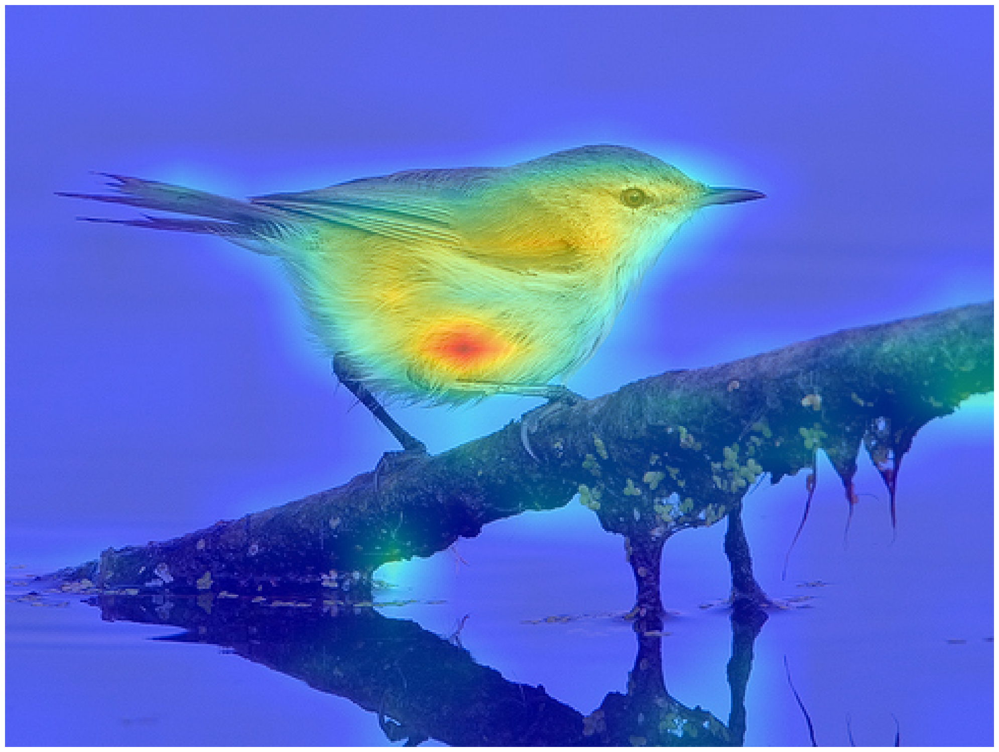

In [46]:
# Resize the CAM and overlay it
result = overlay_mask(image, to_pil_image(mask, mode='F'), alpha=0.5)
# Display it
plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

**Assignment:** The attention rollout mechanism in ViTs is not class-specific. Could you propose a modification of this mechanism to make it class-specific, drawing inspiration from methods like Grad-CAM?





**ANSWER**

By incorporating class-specific gradients, we can weight the attention maps to emphasize regions pertinent to the target class.

The proposed modification includes the following steps:
1. Compute Class-Specific Gradients
  - fist, we perform a forward pass to obtain the logits for the target class.
  - then, we compute the gradients of the target class score with respect to the attention weights.
2. Weight Attention Maps with Gradients
  - we compute the importance of each attention head for the target class.
3. Aggregate Weighted Attention Maps.
  - to obtain a class-specific relevance map, we apply the attention rollout mechanism on the weighted attention maps.
4. Finally, visualize the Class-Specific Relevance Map.




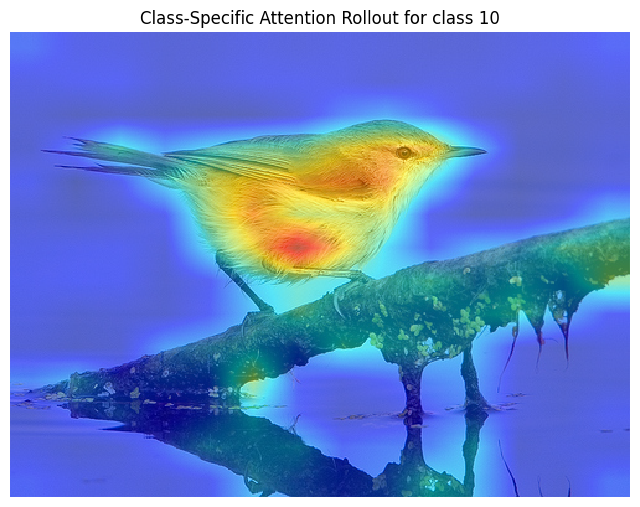

In [50]:
import torch
import torch.nn.functional as F
from transformers import ViTForImageClassification, ViTFeatureExtractor
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image

def overlay_mask(image, mask, alpha=0.5, colormap=cv2.COLORMAP_JET):
    """
    Overlays a heatmap on the image.
    """
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), colormap)
    heatmap = Image.fromarray(cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB))
    return Image.blend(image.convert("RGB"), heatmap, alpha)

modelvit.eval()  # Set model to evaluation mode

# Enable gradient computation for attention weights
for param in modelvit.parameters():
    param.requires_grad = True


image_path = './imagenet/418657219_3567961db1.jpg'
image = Image.open(image_path).convert('RGB')
inputs = feature_extractor(images=image, return_tensors="pt")
# Enable gradients for inputs
inputs = {k: v.requires_grad_() for k, v in inputs.items()}

# Forward pass
outputs = modelvit(**inputs)
logits = outputs.logits

# Choose the target class (e.g., the predicted class)
target_class = logits.argmax(dim=-1).item()

# Compute gradients w.r. to the target class
modelvit.zero_grad()
logits[:, target_class].backward(retain_graph=True)

# Extract attention weights and gradients
attn_weights = outputs.attentions  # List of attention matrices from each layer
gradients = []
for layer in range(len(attn_weights)):
    # Assuming attn_weights[layer] has shape (batch_size, num_heads, seq_len, seq_len)
    attn = attn_weights[layer]
    if attn.requires_grad:
        grad = torch.autograd.grad(
            outputs.attentions[layer],
            outputs.attentions[layer],
            grad_outputs=torch.ones_like(outputs.attentions[layer]),
            retain_graph=True,
            create_graph=True
        )[0]
        gradients.append(grad)
    else:
        # If gradients are not enabled, append zeros
        gradients.append(torch.zeros_like(attn))

# Aggregate (averaging) gradients across heads and layers
grads = [g.mean(dim=1) for g in gradients]  # Shape: (batch_size, seq_len, seq_len)

# Weight the attention maps with the gradients
weighted_attentions = []
for g, a in zip(grads, attn_weights):
    g = g.unsqueeze(1)  # Shape: (batch_size, 1, seq_len, seq_len)
    weighted_a = a * g  # Element-wise multiplication
    weighted_attentions.append(weighted_a)

# Average the weighted attentions across heads
avg_weighted_attns = [weighted_a.mean(dim=1) for weighted_a in weighted_attentions]  # (batch_size, seq_len, seq_len)

# Add residual (identity) and normalize
aug_att_mats = []
for a in avg_weighted_attns:
    residual_att = torch.eye(a.size(-1)).to(a.device)
    aug_att = a + residual_att
    aug_att = aug_att / aug_att.sum(dim=-1, keepdim=True)
    aug_att_mats.append(aug_att)

# Recursively multiply the attention matrices
rollout_attentions = aug_att_mats[0]
for a in aug_att_mats[1:]:
    rollout_attentions = torch.matmul(a, rollout_attentions)

# Extract the relevance for the class token
R = rollout_attentions[:, 0, 1:]  # Shape: (batch_size, num_patches)

# Reshape the relevance map
batch_size, num_patches = R.shape
grid_size = int(np.sqrt(num_patches))
relevance_map = R.view(batch_size, grid_size, grid_size).detach().cpu().numpy()[0]

# Normalize the relevance map
relevance_map = relevance_map - relevance_map.min()
relevance_map = relevance_map / relevance_map.max()

# Resize the relevance map to the input image size
relevance_map_resized = cv2.resize(relevance_map, image.size, interpolation=cv2.INTER_LINEAR)

# Expand dimensions for colormap
relevance_map_resized = np.expand_dims(relevance_map_resized, axis=-1)

# Overlay the relevance map on the image
result = overlay_mask(image, relevance_map_resized, alpha=0.5)

# Display the result
plt.figure(figsize=(8, 8))
plt.imshow(result)
plt.axis('off')
plt.title(f'Class-Specific Attention Rollout for class {target_class}')
plt.show()
